In [1]:
import json
import numpy as np
from matplotlib import pyplot as plt
from scipy.optimize import curve_fit
import os
from tqdm import tqdm
from scipy.optimize import fsolve

In [2]:
def model_size_from_filename(filename):
    return int(filename.split('B')[0].split('-')[-1])

def alpha_from_filename(filename):
    return float(filename.split('alpha-')[-1].split('_')[0])

def draft_from_filename(filename):
    return int(filename.split('draft-')[-1].split('_')[0])

def prompt_length_from_filename(filename):
    return int(filename.split('prompt-')[-1].split('_')[0])

def output_length_from_filename(filename):
    return int(filename.split('output-')[-1].split('_')[0])

In [3]:
def expected_acceptance_length(alpha, draft):
    if alpha == 1.0:
        return draft + 1
    else:
        return (1. - alpha ** (draft + 1)) / (1. - alpha)

In [4]:
def getTTFT(filename):
    with open(filename, 'r') as file:
        data = json.load(file)
    itl=[]
    rps=[]
    # print(data['benchmarks'][0]['metrics'].keys())
    for i in range(len(data)):
        # print(data['benchmarks'][i]['metrics'].keys())
        itl.append(data[i]['time_to_first_token_ms']['successful']['mean'])
        rps.append((data[i]['requests_per_second']['successful']['mean']))
    itl, rps=np.array(itl), np.array(rps)
    # print(itl)
    # print(rps)
    indx=np.argsort(rps)

    return  rps[indx],itl[indx]

def getITL(filename):
    with open(filename, 'r') as file:
        data = json.load(file)
    itl=[]
    rps=[]
    # print(data['benchmarks'][0]['metrics'].keys())
    for i in range(len(data)):
        # print(data['benchmarks'][i]['metrics'].keys())
        itl.append(data[i]['inter_token_latency_ms']['successful']['mean'])
        #rps.append((data[i]['requests_per_second']['successful']['mean']))
        rps.append((data[i]['requests_per_second']['successful']['mean']))
    # print(itl)
    # print(rps)
    indx=np.argsort(rps)
    itl = itl[indx]
    rps = rps[indx]

    return  rps,itl

def getRequestLatency(filename):
    with open(filename, 'r') as file:
        data = json.load(file)
    itl=[]
    rps=[]

    # print(data['benchmarks'][0]['metrics'].keys())
    for i in range(len(data)):
        # print(data['benchmarks'][i]['metrics']['request_latency']['successful'].keys())
        itl.append(data[i]['request_latency']['successful']['mean'] * 1000)
        rps.append((data[i]['requests_per_second']['successful']['mean']))
    itl, rps=np.array(itl), np.array(rps)
    indx=np.argsort(rps)
    itl = itl[indx]
    rps = rps[indx]
    itl = itl[:-4]
    rps = rps[:-4]
    return  rps, itl

def getTPOT(filename):
    with open(filename, 'r') as file:
        data = json.load(file)
    itl=[]
    rps=[]
    # print(data['benchmarks'][0]['metrics'].keys())
    for i in range(len(data)):
        # print(data['benchmarks'][i]['metrics'].keys())
        itl.append(data[i]['time_per_output_token_ms']['successful']['mean'])
        rps.append((data[i]['requests_per_second']['successful']['mean']))
    itl, rps=np.array(itl), np.array(rps)
    # print(itl)
    # print(rps)
    indx=np.argsort(rps)

    return  rps[indx],itl[indx]


In [5]:
def model(x, Et, k, parameters, draft_parameters, h, nlayers, *args):
    b1c = args[0]
    b2c = args[1]
    c1c = args[2]
    c2c = args[3]
    d1c = args[4]
    d2c = args[5]
    f1c = args[6]
    f2c = args[7]
    b1p = args[8]
    b2p = args[9]  
    c1p = args[10]
    c2p = args[11]
    d1p = args[12]
    d2p = args[13]
    f1p = args[14]
    f2p = args[15]
    b1h = args[16]
    b2h = args[17]
    c1h = args[18]
    c2h = args[19]
    d1h = args[20]
    d2h = args[21]
    f1h = args[22]
    f2h = args[23]
    b1nh = args[24]
    b2nh = args[25]
    c1nh = args[26]
    c2nh = args[27]
    d1nh = args[28]
    d2nh = args[29]
    f1nh = args[30]
    f2nh = args[31]
    b1d = args[32]
    b2d = args[33]
    c1d = args[34]
    c2d = args[35]
    d1d = args[36]
    d2d = args[37]
    f1d = args[38]
    f2d = args[39]

    b1 = b1c + b1p*parameters + b1h*h + b1nh*nlayers*h + b1d*draft_parameters
    b2 = b2c + b2p*parameters + b2h*h + b2nh*nlayers*h + b2d*draft_parameters
    c1 = c1c + c1p*parameters + c1h*h + c1nh*nlayers*h + c1d*draft_parameters
    c2 = c2c + c2p*parameters + c2h*h + c2nh*nlayers*h + c2d*draft_parameters
    d1 = d1c + d1p*parameters + d1h*h + d1nh*nlayers*h + d1d*draft_parameters
    d2 = d2c + d2p*parameters + d2h*h + d2nh*nlayers*h + d2d*draft_parameters
    f1 = f1c + f1p*parameters + f1h*h + f1nh*nlayers*h + f1d*draft_parameters
    f2 = f2c + f2p*parameters + f2h*h + f2nh*nlayers*h + f2d*draft_parameters
    return (b1 + b2*k + (c1 + c2*k)/Et) / (1 - (d1 + d2*k + (f1 + f2*k)/Et) * x)


In [6]:
def fit_ITL_from_RPS(rps, lat, Et, k, parameters, draft_parameters, nlayers, h):
    def fit_model(x, Et, k, parameters, draft_parameters, h, nlayers,*args):
        rps, lat = x
        return model(rps, Et, k, parameters, draft_parameters, h, nlayers, *args) / lat
    A = np.vstack(
        [
            1/lat,
            k/lat,
            1/Et/lat,
            k/Et/lat,
            rps,
            rps*k,
            rps/Et,
            rps*k/Et,
            parameters/lat,
            parameters*k/lat,
            parameters/Et/lat,
            parameters*k/Et/lat,
            parameters*rps,
            parameters*rps*k,
            parameters*rps/Et,
            parameters*rps*k/Et,
            h/lat,
            h*k/lat,
            h/Et/lat,
            h*k/Et/lat,
            h*rps,
            h*rps*k,
            h*rps/Et,
            h*rps*k/Et,
            nlayers*h/lat,
            nlayers*h*k/lat,
            nlayers*h/Et/lat,
            nlayers*h*k/Et/lat,
            nlayers*h*rps,
            nlayers*h*rps*k,
            nlayers*h*rps/Et,
            nlayers*h*rps*k/Et,
            draft_parameters/lat,
            draft_parameters*k/lat,
            draft_parameters/Et/lat,
            draft_parameters*k/Et/lat,
            draft_parameters*rps,
            draft_parameters*rps*k,
            draft_parameters*rps/Et,
            draft_parameters*rps*k/Et,
        ]
    ).T
    z = np.ones_like(rps)
    args0 = np.linalg.lstsq(A, z, rcond=None)[0]   # z ≈ a + b x
    popt = args0
    print(len(popt))
    #popt, pcov = curve_fit(fit_model, (rps, lat), np.ones_like(rps), p0=args0, maxfev=10000)
    return popt

### Formulation: ITL = c1 / (1 - c2 * RPS)

In [7]:
model_sizes = ["0.6B", "1.7B", "4B", "8B", "14B", "32B"]
alphas = [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
drafts = [1, 2, 3, 4, 5, 6, 8, 10]
parameters = {0:0.76, 1:2, 2:4.4, 3:8, 4:14, 5:32}
drafter_parameters = {0:0.205, 1:0.214, 2:0.58, 3:1, 4:1.3, 5:1.48}
h = {0:1024, 1:2048, 2:2560, 3:4096, 4:5120, 5:5120}
nlayers = {0:28, 1:28, 2:36, 3:36, 4:40, 5:64}

In [8]:
DATA_DIR = "."


In [9]:
rps_fit = None
lat_fit = None
Et_fit = None
k_fit = None
p_fit = None
d_fit = None
h_fit = None
nlayers_fit = None
for size, model_size in enumerate(tqdm(model_sizes)):
    for j, draft in enumerate(drafts):
        for i, alpha in enumerate(alphas):
            path = f"{DATA_DIR}/output_Qwen3-{model_size}_FS_alpha-{alpha:.2f}_draft-{draft}_prompt-512_output-128_concurrency-128_reduced.json"
            rps_, lat_ = getRequestLatency(path)
            Et_ = expected_acceptance_length(alpha, draft)
            Et_ = np.ones_like(rps_) * Et_
            k_ = np.ones_like(rps_) * draft
            p_ = np.ones_like(rps_) * parameters[size]
            d_ = np.ones_like(rps_) * drafter_parameters[size]
            h_ = np.ones_like(rps_) * h[size]
            nlayers_ = np.ones_like(rps_) * nlayers[size]

            if rps_fit is None:
                rps_fit = rps_
                lat_fit = lat_
                Et_fit = Et_
                k_fit = k_
                p_fit = p_
                d_fit = d_
                h_fit = h_
                nlayers_fit = nlayers_
            else:
                rps_fit = np.concatenate((rps_fit, rps_))
                lat_fit = np.concatenate((lat_fit, lat_))
                Et_fit = np.concatenate((Et_fit, Et_))
                k_fit = np.concatenate((k_fit, k_))
                p_fit = np.concatenate((p_fit, p_))
                d_fit = np.concatenate((d_fit, d_))
                h_fit = np.concatenate((h_fit, h_))
                nlayers_fit = np.concatenate((nlayers_fit, nlayers_))

fit_reference = fit_ITL_from_RPS(rps_fit, lat_fit, Et_fit, k_fit, p_fit, d_fit, nlayers_fit, h_fit)
print(fit_reference)
    

100%|██████████| 6/6 [00:00<00:00,  9.61it/s]

40
[ 4.94794442e+01  1.47323036e+00  5.96760711e+02  1.78227435e+02
  4.45539936e-03 -2.69563700e-04  1.92487370e-02  2.68788480e-03
  2.90256298e+01 -3.12694666e+00  4.48519280e+01  3.67091508e+01
  2.98557546e-03  1.46000417e-04  6.67254186e-03 -1.58115048e-03
  6.74758040e-02 -9.50579965e-03 -4.09248189e-01  1.06172204e-01
 -6.25562081e-06  5.21729455e-07 -7.47651243e-06 -5.16373885e-06
 -3.57539475e-03  4.43592102e-04  1.66539927e-02 -5.26978759e-03
  1.53685288e-07 -1.63305070e-08  1.31860179e-07  2.68059201e-07
  3.43145956e+01 -2.27150970e+00  7.87651609e+01  5.21344962e+01
  6.44069572e-03 -1.70677775e-04 -2.58715793e-02  7.71812975e-04]


In [10]:
def error(fit):
    model_lat = model(rps_fit, Et_fit, k_fit, p_fit, d_fit, h_fit, nlayers_fit, *fit)
    return np.sqrt(np.mean((lat_fit/ model_lat - 1)**2))

In [11]:
print(error(fit_reference))

0.0457837757377768


In [12]:
fit = fit_reference.copy()
#fit[1] = 0
#fit[5] = 0
fit[-1] = 0
print(error(fit))

0.048910435797714716


  0%|          | 0/6 [00:00<?, ?it/s]

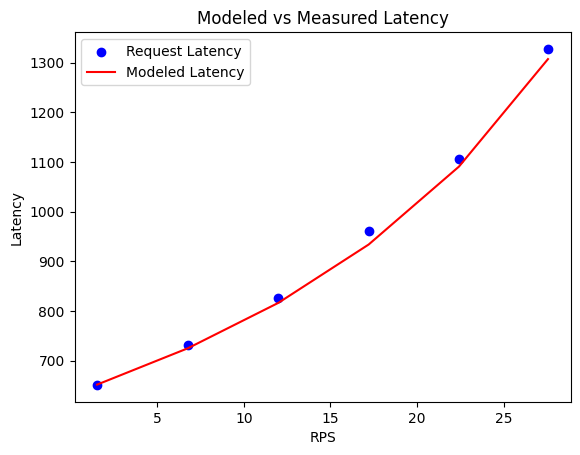

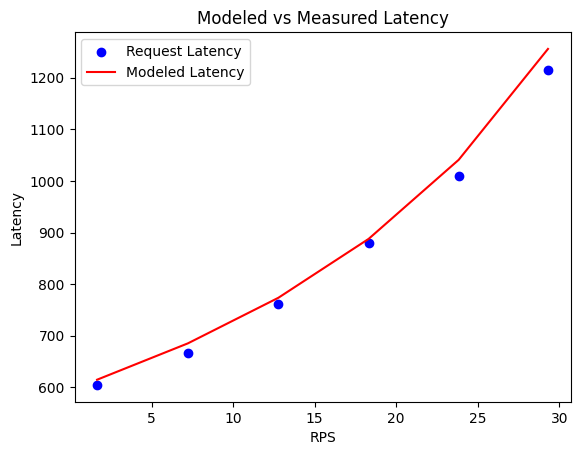

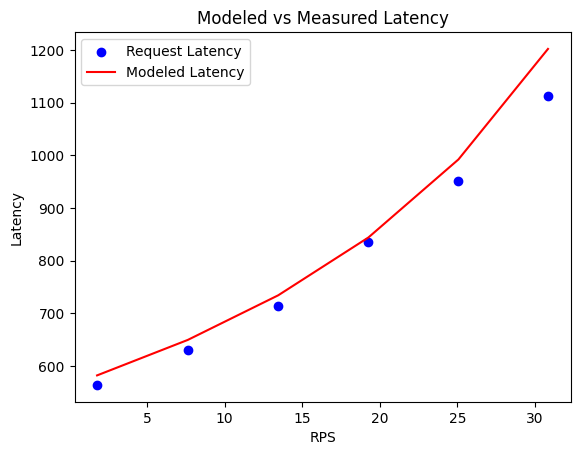

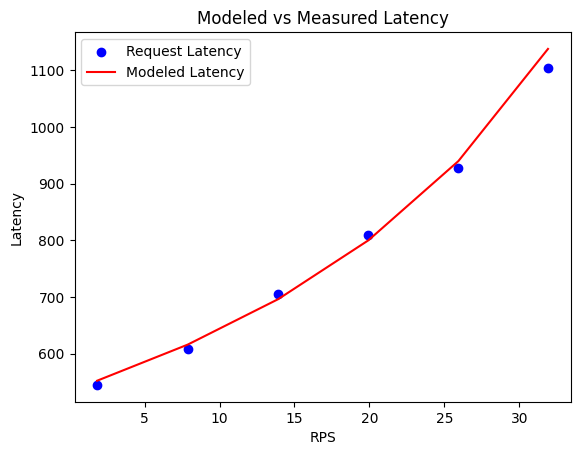

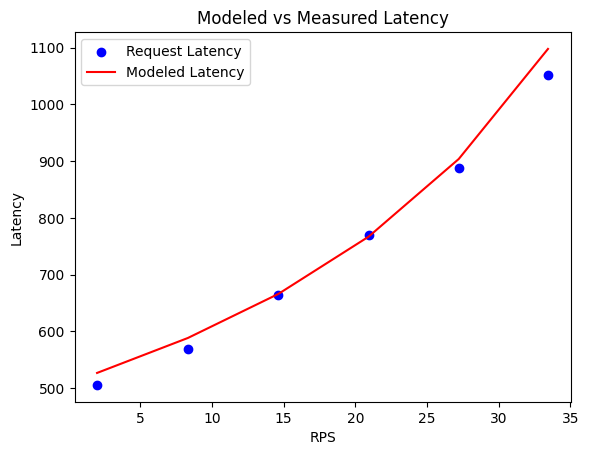

...

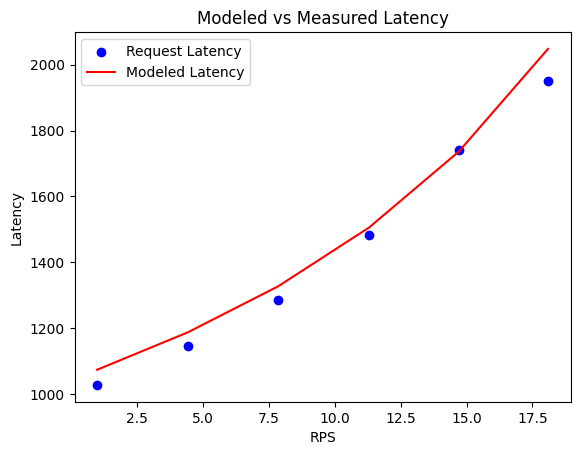

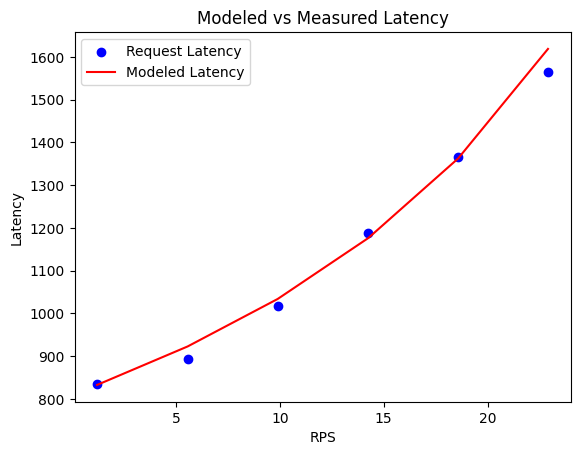

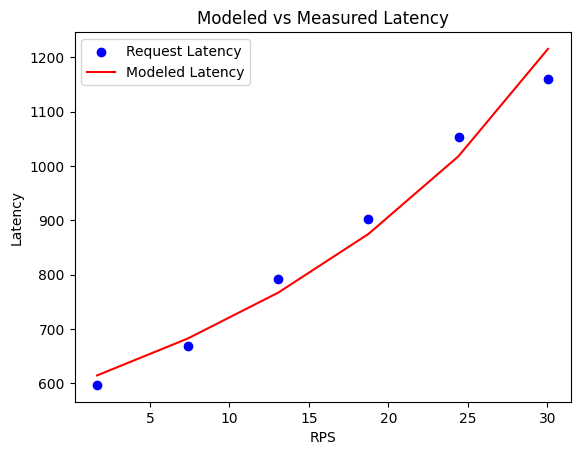

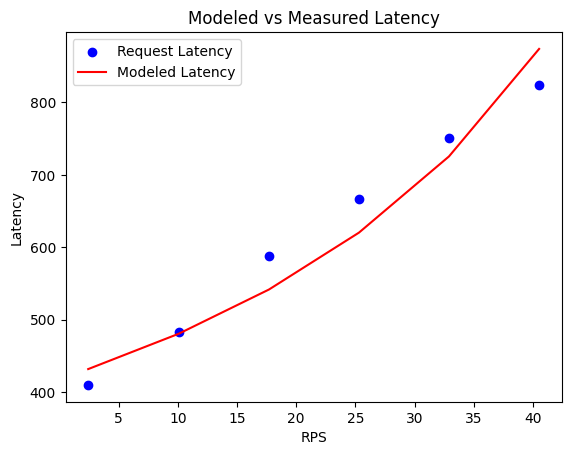

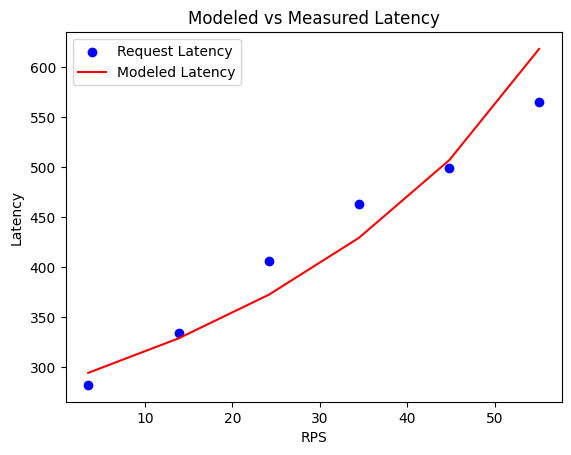

 17%|█▋        | 1/6 [00:02<00:11,  2.22s/it]

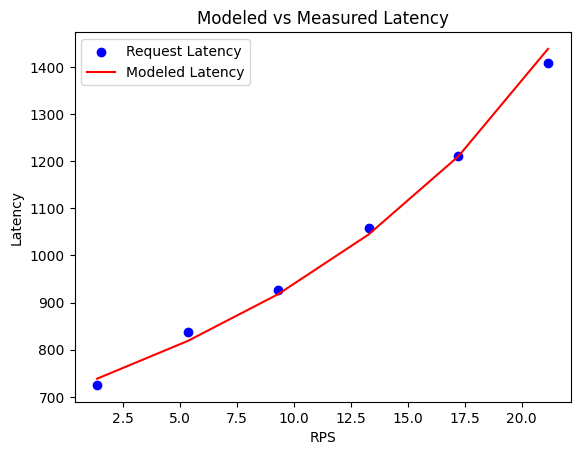

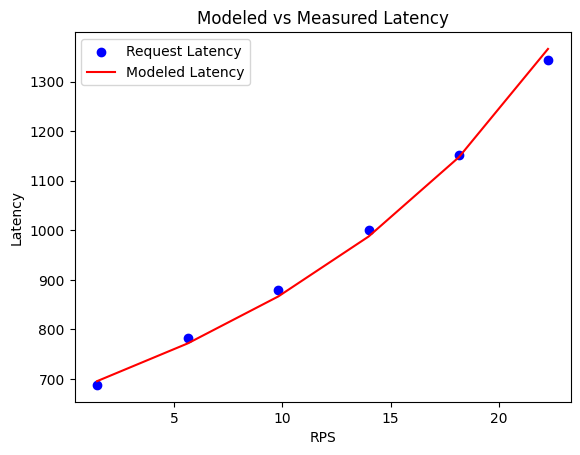

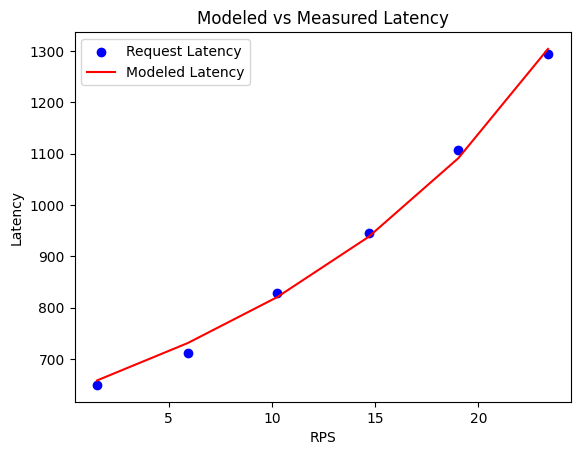

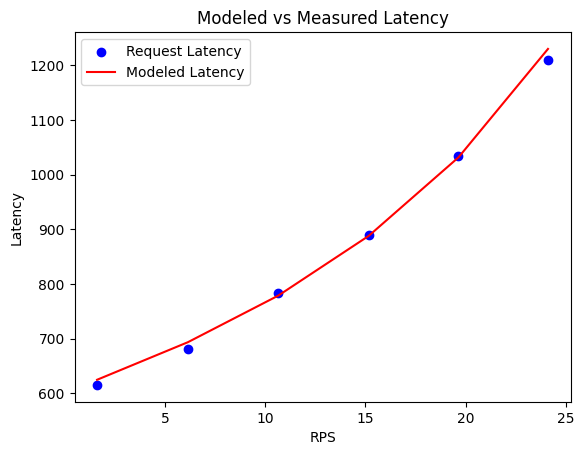

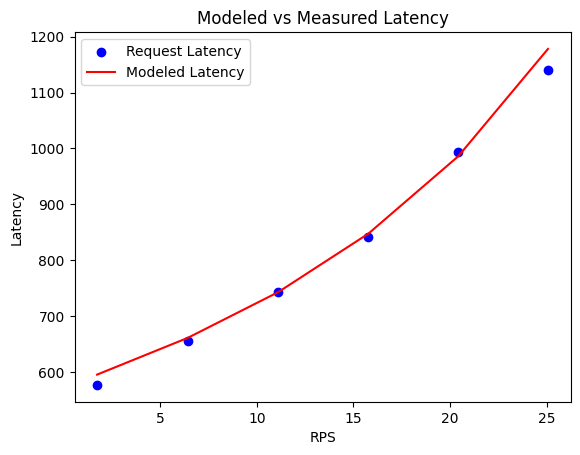

...

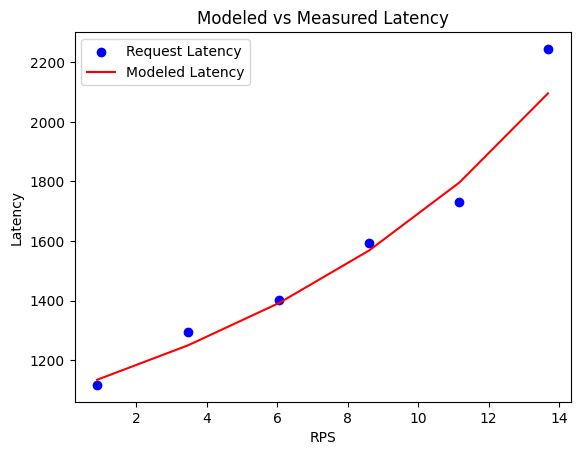

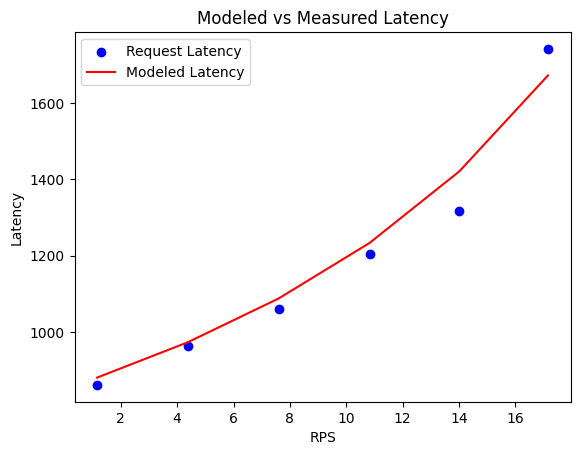

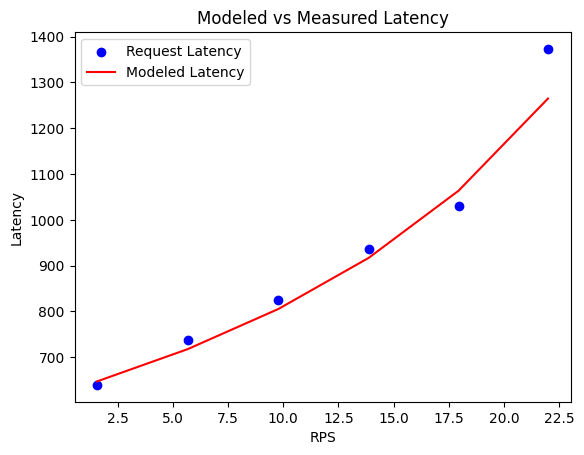

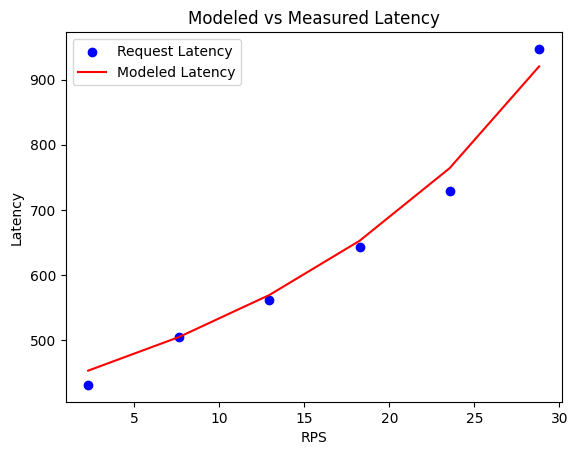

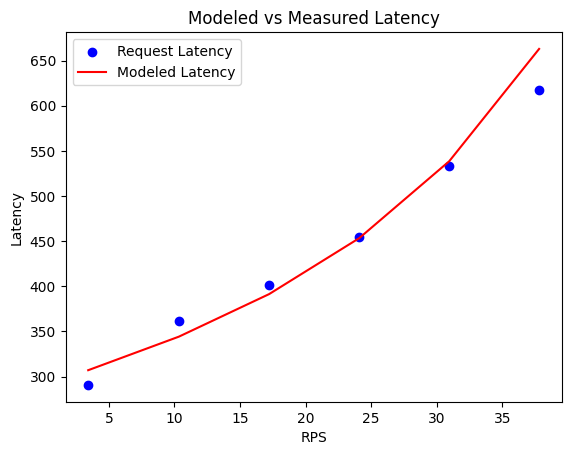

 33%|███▎      | 2/6 [00:04<00:08,  2.23s/it]

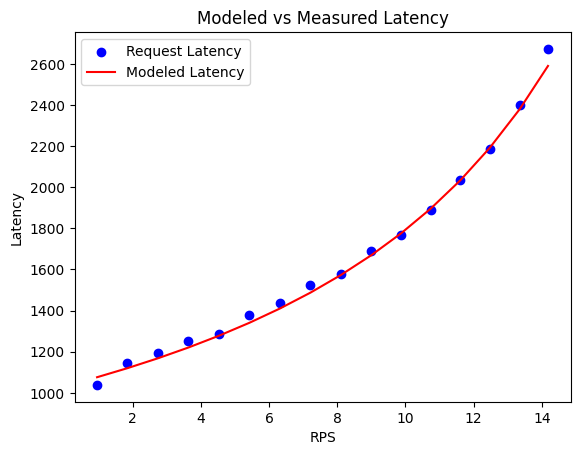

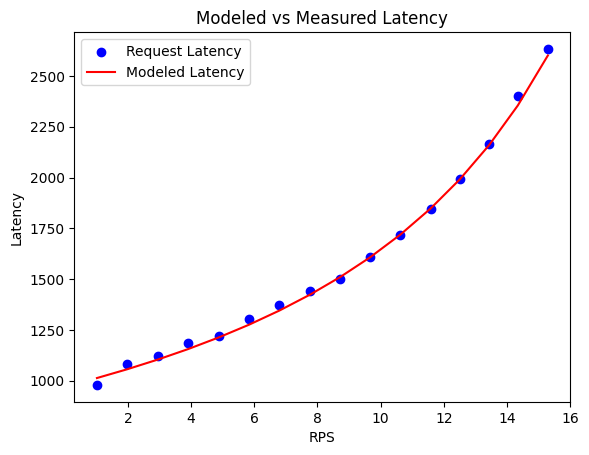

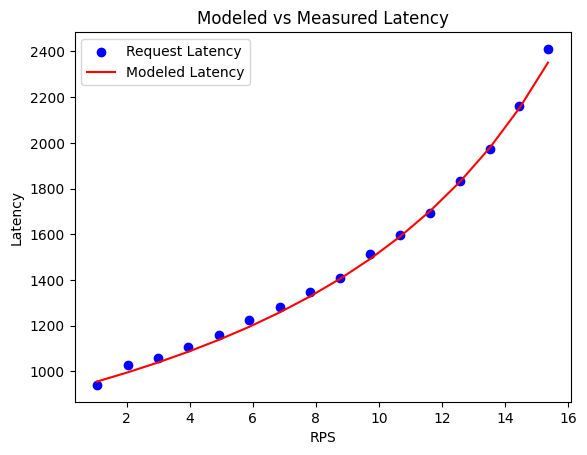

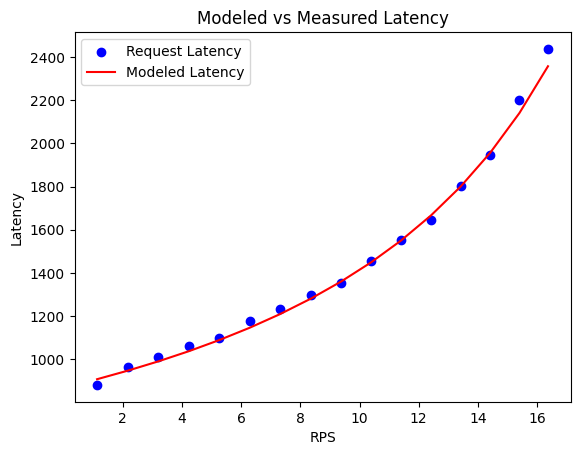

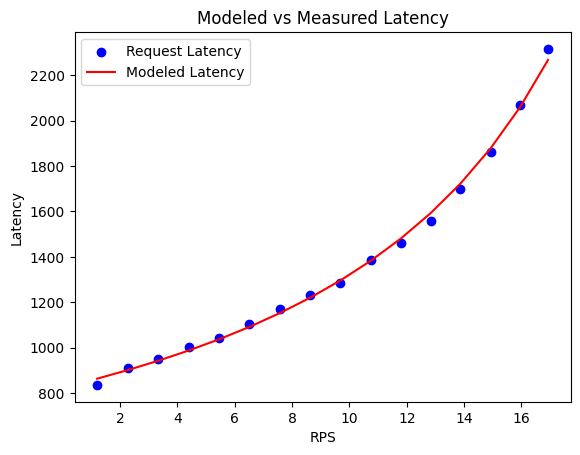

...

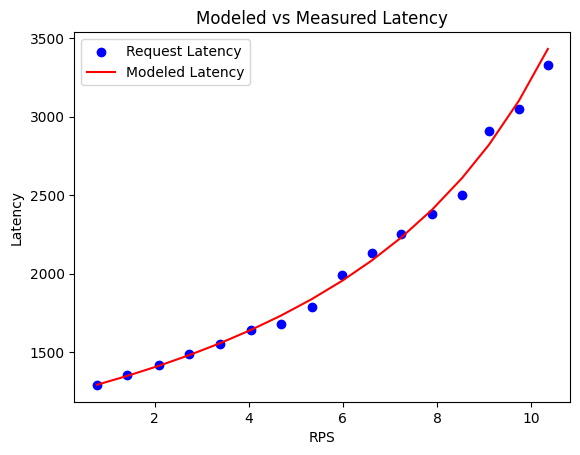

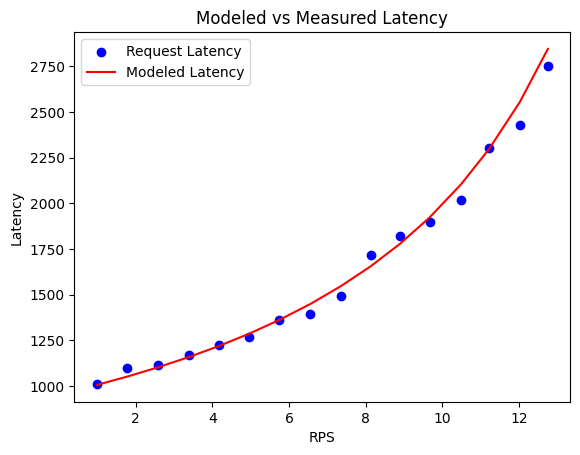

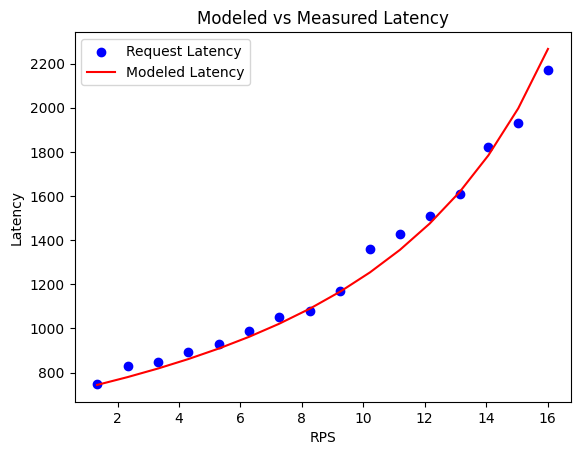

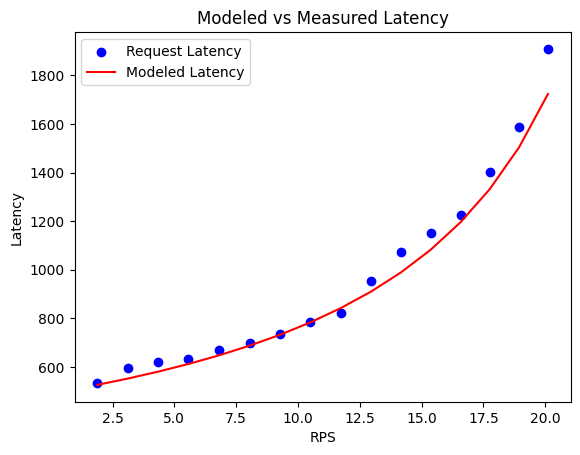

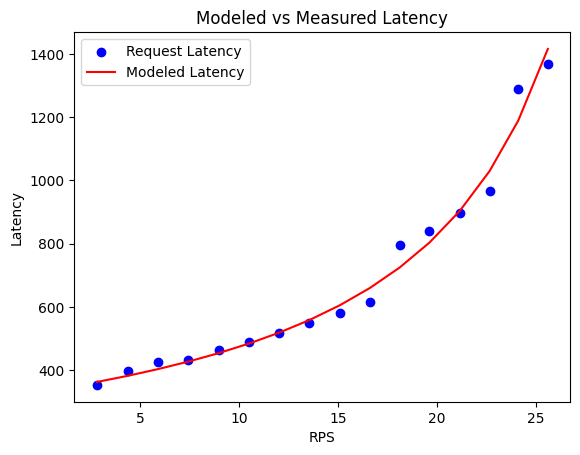

 50%|█████     | 3/6 [00:07<00:07,  2.40s/it]

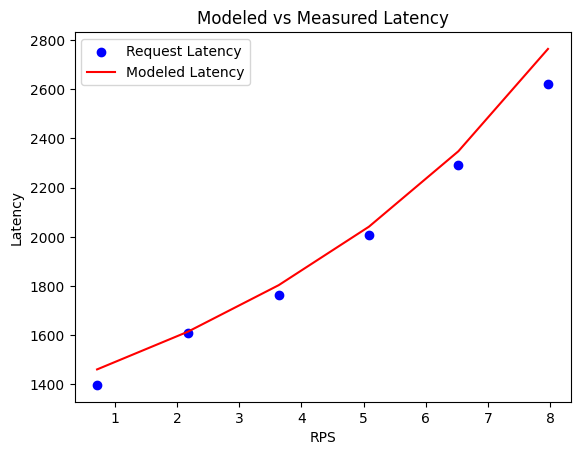

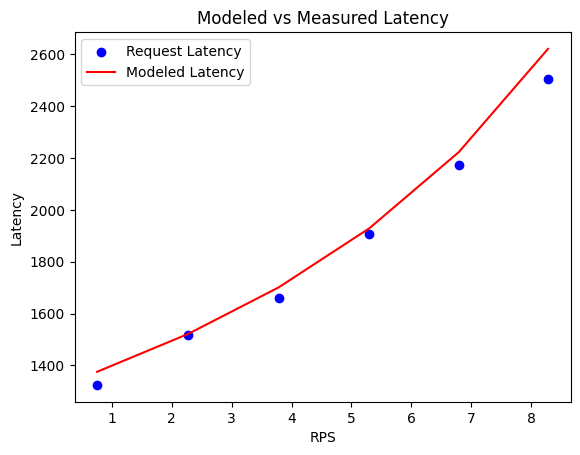

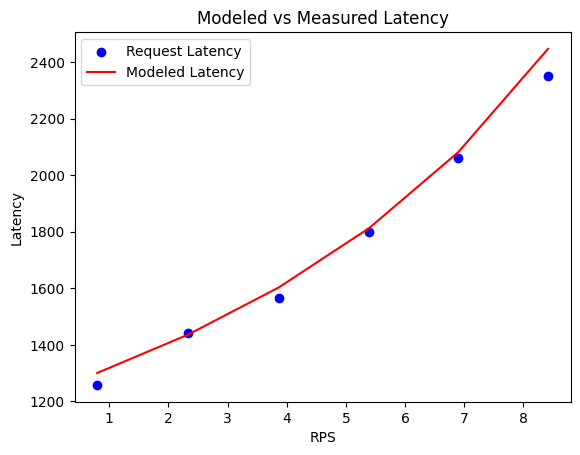

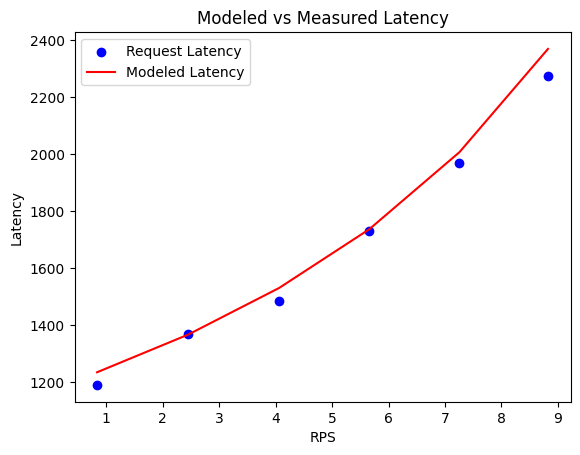

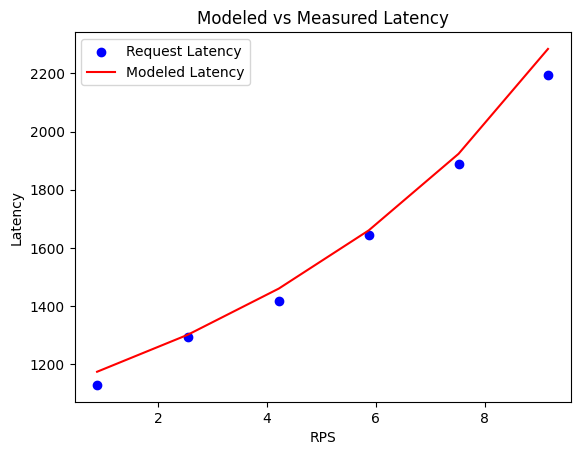

...

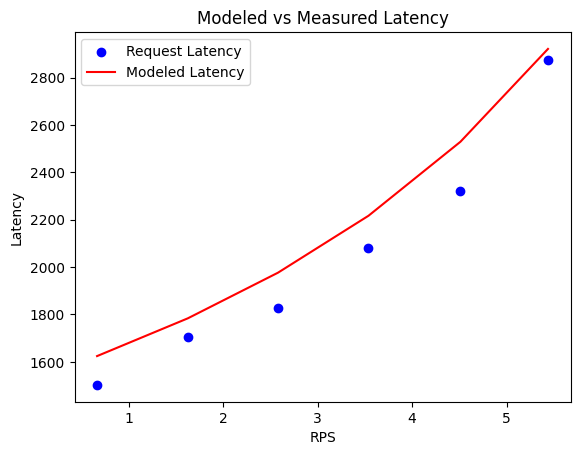

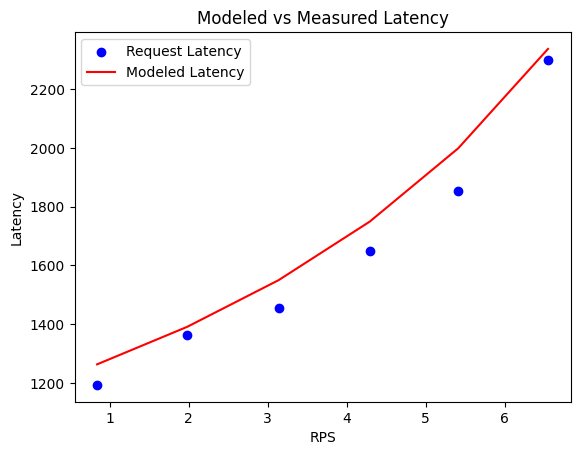

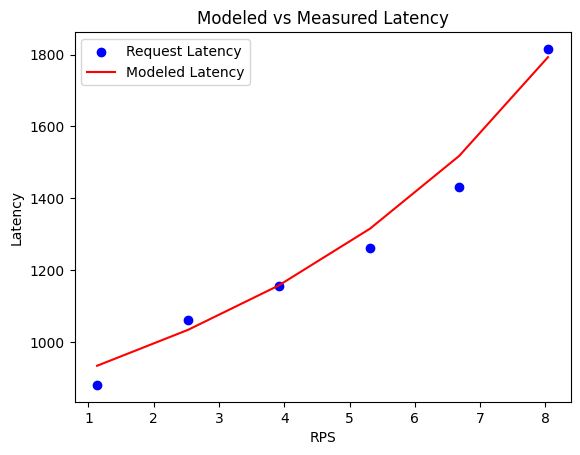

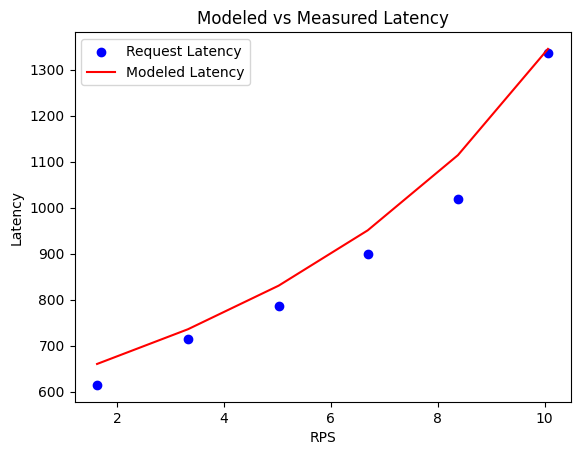

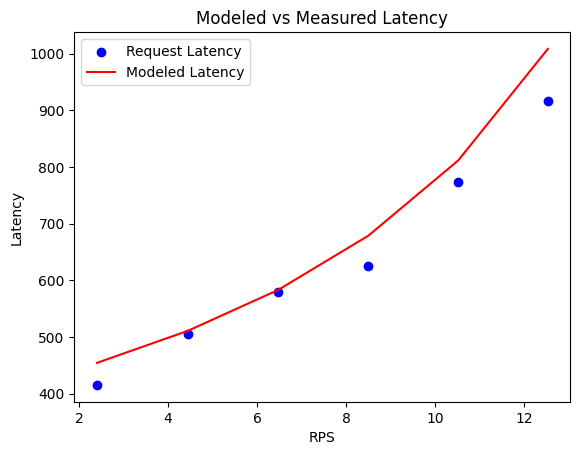

 67%|██████▋   | 4/6 [00:09<00:05,  2.58s/it]

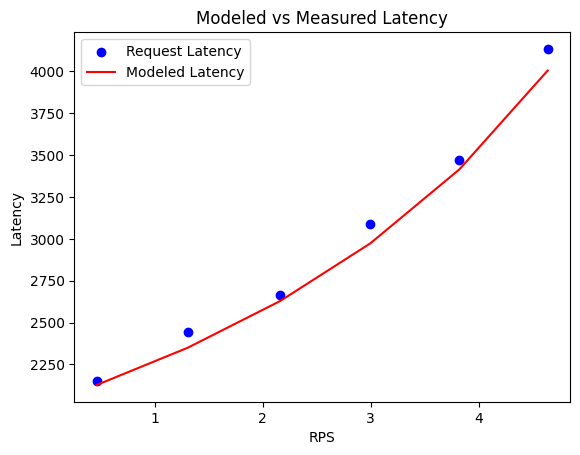

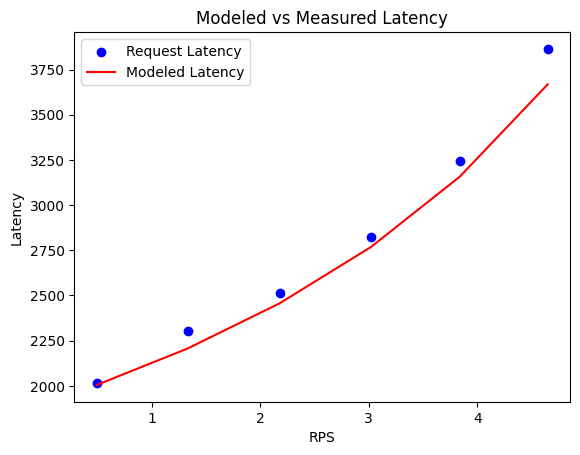

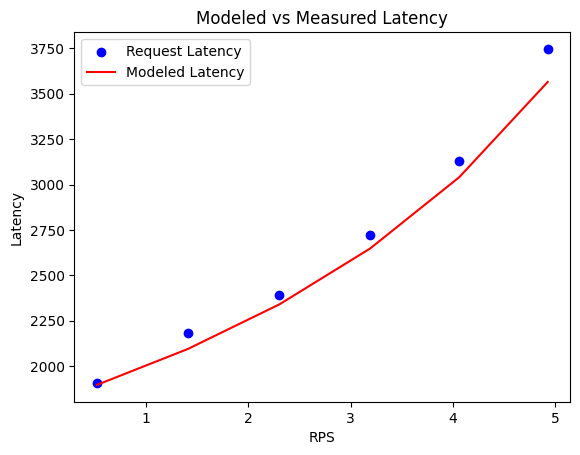

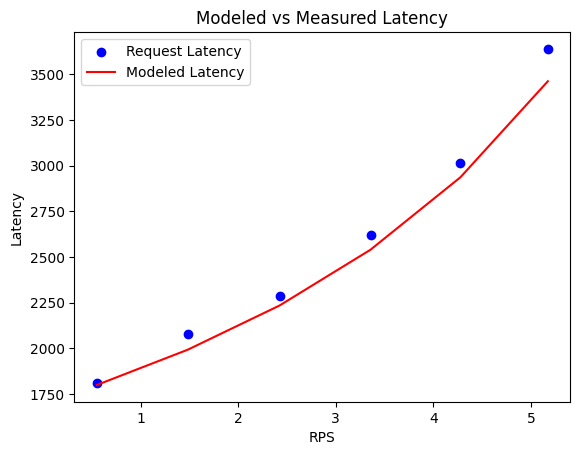

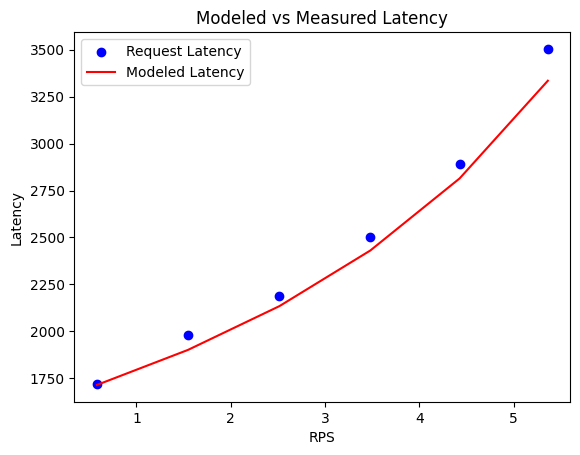

...

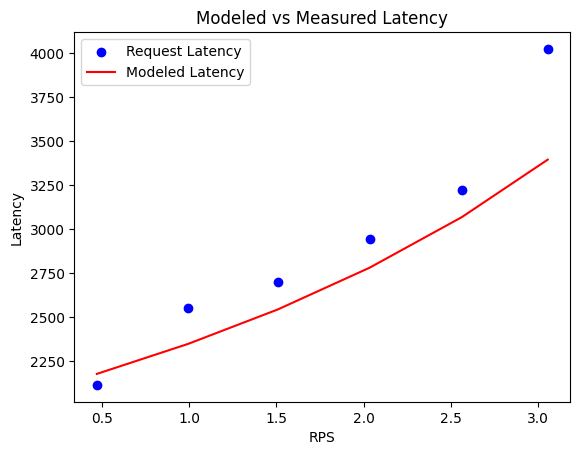

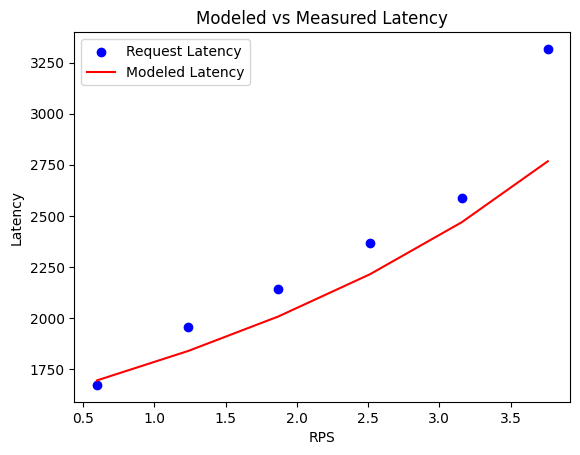

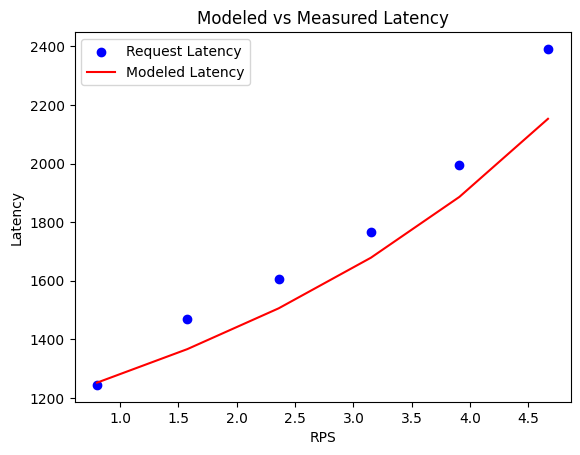

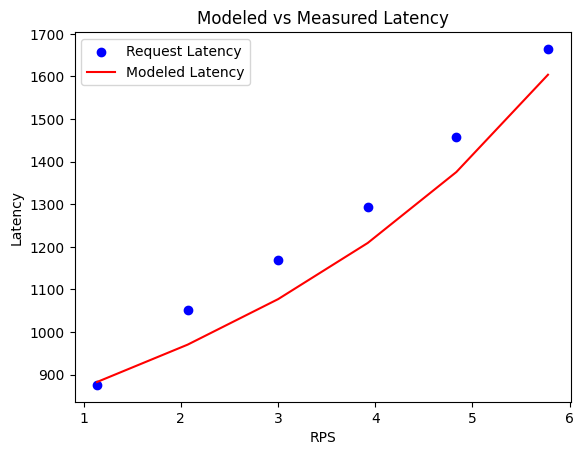

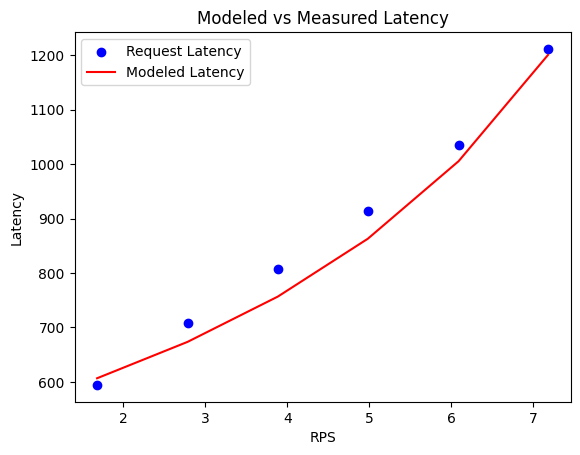

 83%|████████▎ | 5/6 [00:13<00:02,  2.82s/it]

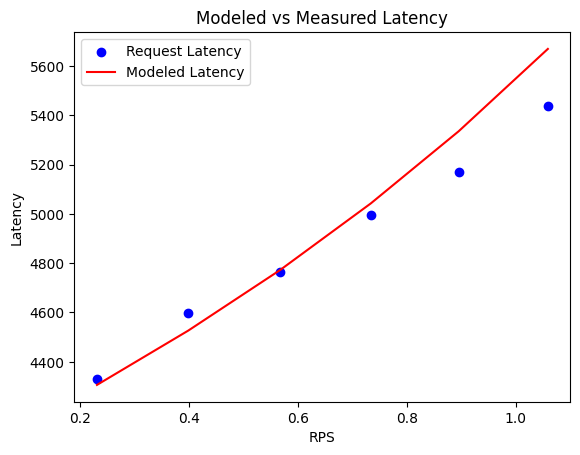

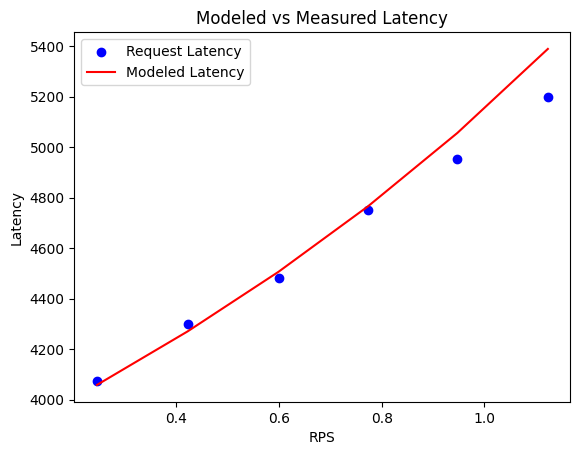

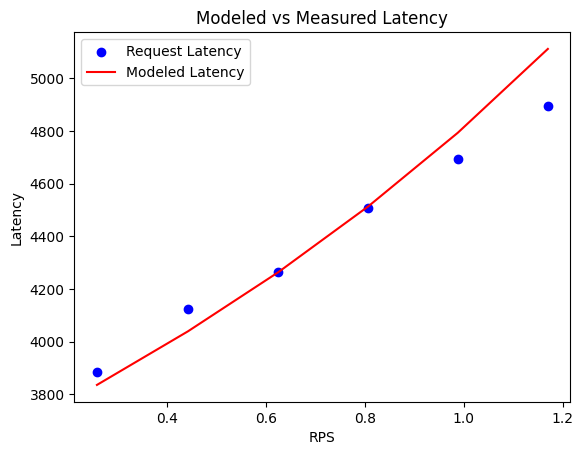

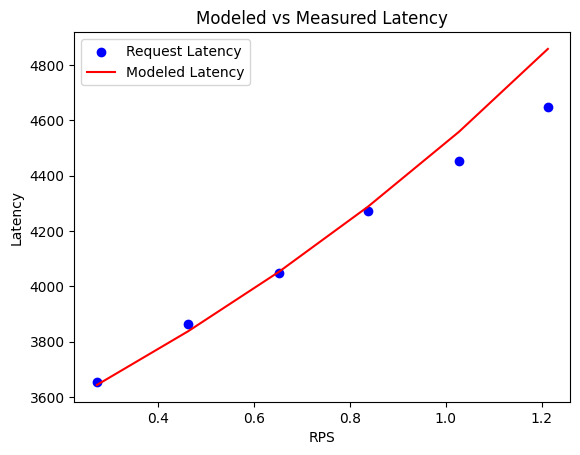

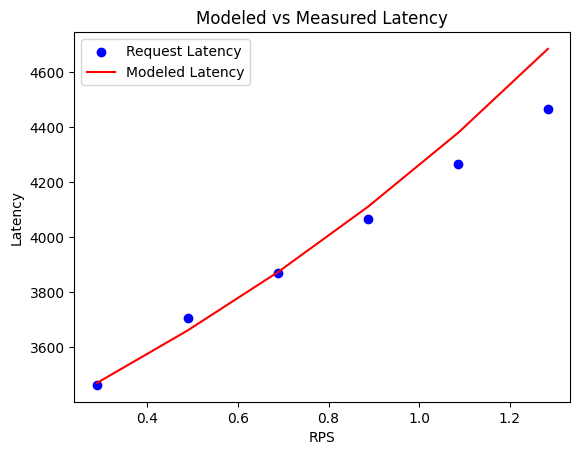

...

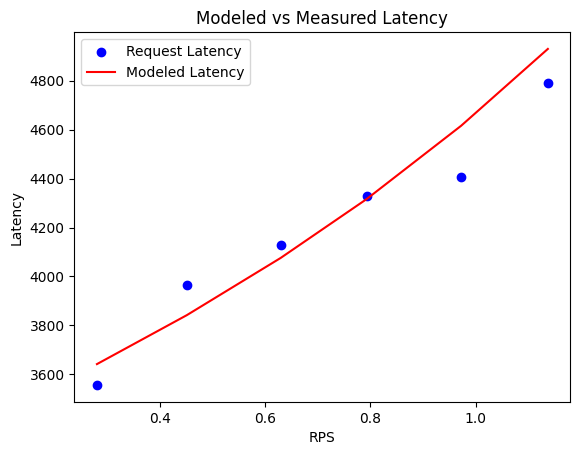

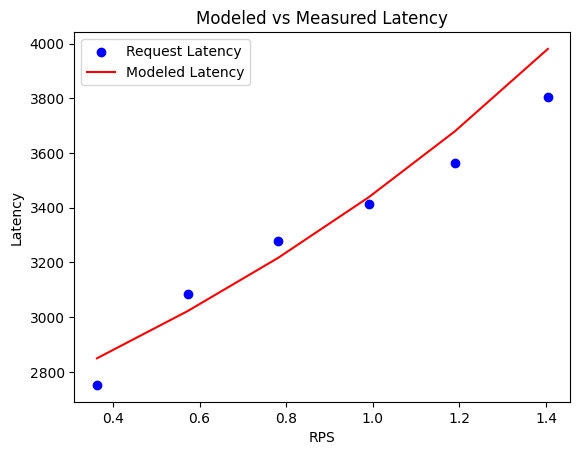

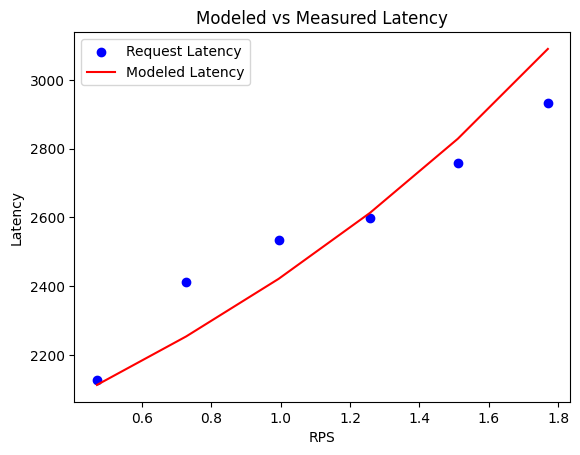

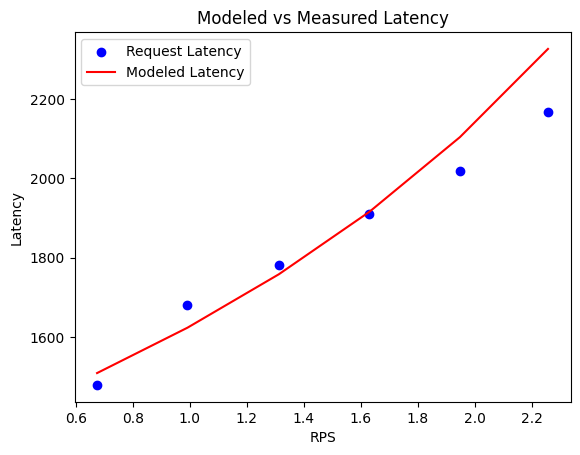

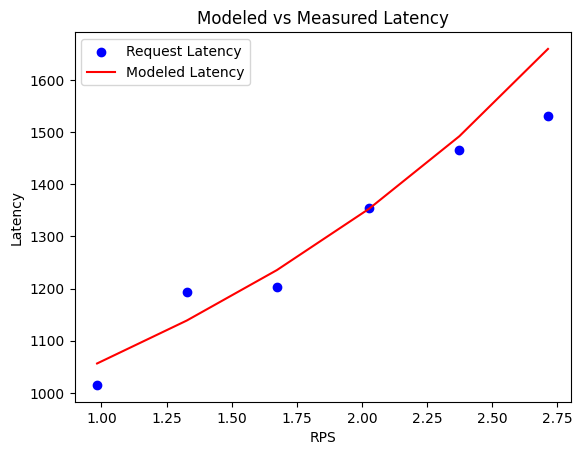

100%|██████████| 6/6 [00:16<00:00,  2.74s/it]


In [13]:

for size, model_size in enumerate(tqdm(model_sizes)):
    for j, draft in enumerate(drafts):
        for i, alpha in enumerate(alphas):
            path = f"{DATA_DIR}/output_Qwen3-{model_size}_FS_alpha-{alpha:.2f}_draft-{draft}_prompt-512_output-128_concurrency-128_reduced.json"
            rps, lat = getRequestLatency(path)
            Et = expected_acceptance_length(alpha, draft)
            model_lat = model(rps, Et, draft, parameters[size], drafter_parameters[size], h[size], nlayers[size], *fit_reference)
        
        
            plt.scatter(rps, lat, label='Request Latency', color='blue')
            plt.xlabel("RPS")
            plt.ylabel("Latency")
            plt.title("Modeled vs Measured Latency")
            plt.plot(rps, model_lat, label='Modeled Latency', color='red')
            plt.legend()
            plt.show()
